In [12]:
import scanpy as sc
import pandas as pd
import numpy as np
import sys
sys.path.append('../')
from tqdm import tqdm
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import yaml
import anndata as ad
import matplotlib.pyplot as plt
import squidpy as sq
import glob

In [ ]:
from src.knn import EnhancedKNNClassifier
from sklearn.decomposition import PCA

In [7]:
ref_lung_atlas = sc.read_h5ad("/cluster/customapps/biomed/grlab/users/knonchev/lung_atlas/b351804c-293e-4aeb-9c4c-043db67f4540.h5ad")
ref_lung_atlas.var.index = ref_lung_atlas.var.feature_name.values
ref_lung_atlas

AnnData object with n_obs × n_vars = 584944 × 27957
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'dataset', 'entropy_dataset_leiden_3', 'entropy_original_ann_level_1_leiden_3', 'entropy_original_ann_level_2_clean_leiden_3', 'entropy_original_ann_level_3_clean_leiden_3', 'entropy_subject_ID_leiden_3', 'fresh_or_frozen', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_5', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'n_genes_detected', 'original_ann_highest_res', 'original_ann_level_1', '

In [8]:
with open("config_dataset.yaml", "r") as stream:
    config_dataset = yaml.safe_load(stream)

config_dataset

{'MODEL': ['STNet', 'DeepSpot', 'BLEEP'],
 'downsample_factor': 10,
 'spot_diameter': 142,
 'spot_distance': 220,
 'white_cutoff': 200,
 'metadata_path': 'data/metadata_ff.csv',
 'metadata_path_other': 'data/metadata_ffpe.csv',
 'out_folder': 'out_benchmark_ff',
 'source_data_path': 'LUNG_CANCER'}

In [9]:
adata_genes = pd.read_csv(f"../{config_dataset['source_data_path']}/out_benchmark/info_highly_variable_genes.csv").query("isPredicted == True").gene_name.values
shared_genes = np.array(list(set(ref_lung_atlas.var.feature_name.values) & set(adata_genes)))
len(shared_genes)

4982

In [10]:
ref_lung_atlas = ref_lung_atlas[:, shared_genes].copy()
sc.pp.filter_cells(ref_lung_atlas, min_genes=10)
ref_lung_atlas.X = ref_lung_atlas.X.toarray()

In [11]:
sc.pp.pca(ref_lung_atlas)
sc.pp.neighbors(ref_lung_atlas)
sc.tl.umap(ref_lung_atlas)

In [14]:
metadata = pd.read_csv(config_dataset['metadata_path'])
metadata

,image_path,rna_path,case_id,sample_slide_id,sample_rna_id,sample_type,data_type_info,id_pair
0,TCGA-44-2665-01A-01-TS1.c5b2abc1-bff0-431b-890...,77b82c3f-e20c-4e3b-a55c-08af359bbb6e.rna_seq.a...,TCGA-44-2665,TCGA-44-2665-01A,TCGA-44-2665-01A,Primary,TS,0
1,TCGA-44-2665-01A-01-TS1.c5b2abc1-bff0-431b-890...,af649713-fb41-496a-a94b-3691d202c1c8.rna_seq.a...,TCGA-44-2665,TCGA-44-2665-01A,TCGA-44-2665-01A,Primary,TS,1
2,TCGA-97-7937-01A-01-TS1.52bec102-5ea6-4f89-b3c...,d1eba37d-0b00-47f4-a7c8-d2e80ec3e27b.rna_seq.a...,TCGA-97-7937,TCGA-97-7937-01A,TCGA-97-7937-01A,Primary,TS,2
3,TCGA-44-2665-11A-01-TS1.e284642f-9ea2-473f-b1e...,2b4652fb-eef5-427e-b4f0-24164c042e52.rna_seq.a...,TCGA-44-2665,TCGA-44-2665-11A,TCGA-44-2665-11A,Not Applicable,TS,3
4,TCGA-64-5774-01A-01-TS1.1b1c8581-82a8-43a9-a78...,5a335f07-9b07-46cf-8902-503b24f89bfa.rna_seq.a...,TCGA-64-5774,TCGA-64-5774-01A,TCGA-64-5774-01A,Primary,TS,4
...,...,...,...,...,...,...,...,...
550,TCGA-62-8397-01A-01-TS1.faf5296f-faaf-4d36-8f4...,21a80f43-21be-4549-901b-c99083021c30.rna_seq.a...,TCGA-62-8397,TCGA-62-8397-01A,TCGA-62-8397-01A,Primary,TS,550
551,TCGA-99-8033-01A-01-TS1.c9f52107-d2d5-4e7d-b30...,e0dabde8-1dd8-4aa6-9f23-51dc22fc2cae.rna_seq.a...,TCGA-99-8033,TCGA-99-8033-01A,TCGA-99-8033-01A,Primary,TS,551
552,TCGA-78-8655-01A-01-TS1.5a514f0a-6e90-4ddb-962...,bc8b6dee-0f79-492f-85e1-c1a09d6f9680.rna_seq.a...,TCGA-78-8655,TCGA-78-8655-01A,TCGA-78-8655-01A,Primary,TS,552
553,TCGA-97-7554-01A-01-TS1.f7ebd35c-ecac-4d02-876...,aa305f5b-4c1d-4bc7-81d5-b2b999b327af.rna_seq.a...,TCGA-97-7554,TCGA-97-7554-01A,TCGA-97-7554-01A,Primary,TS,553


In [76]:
transfer_label = "ann_level_2"
clf = KNeighborsClassifier(n_jobs=-1, n_neighbors=15)
clf.fit(ref_lung_atlas.obsm["X_pca"], ref_lung_atlas.obs[transfer_label].values)

KNeighborsClassifier(n_jobs=-1, n_neighbors=15)

In [77]:
adatas = []
for sample_id in tqdm(metadata.id_pair[10:20]):
    model = "DeepSpot"
    adata_path = f"{config_dataset['out_folder']}/prediction/{model}/data/h5ad/{sample_id}.h5ad"
    adata = sc.read_h5ad(adata_path)
    #del adata.uns
    #del adata.obsm
    #n_spots = min(1000, len(adata))
    #if len(adata) > n_spots:
    #    adata = adata[np.random.choice(adata.obs_names, n_spots),:].copy()
    adata = adata[:, shared_genes].copy()
    sc.tl.ingest(adata, ref_lung_atlas, embedding_method=('umap', 'pca'))
    adata.obs[transfer_label] = clf.predict(adata.obsm["X_pca"])
    adatas.append(adata)

  0%|          | 0/10 [00:00<?, ?it/s]/cluster/customapps/biomed/grlab/users/knonchev/miniconda3/envs/nonchev/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 10%|█         | 1/10 [00:28<04:20, 28.92s/it]/cluster/customapps/biomed/grlab/users/knonchev/miniconda3/envs/nonchev/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
 20%|██        | 2/10 [00:57<03:49, 28.69s/it]/cluster/customapps/biomed/grlab/users/knonchev/miniconda3/envs/nonchev/lib/python3.9/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.


In [78]:
adata_concat = ad.concat([ref_lung_atlas, *adatas], label="Modality", 
                         keys=["Single-cell", *[f"H&E {s}" for s in metadata.id_pair[:10]]])
adata_concat

/cluster/customapps/biomed/grlab/users/knonchev/miniconda3/envs/nonchev/lib/python3.9/site-packages/anndata/_core/merge.py:1362: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
/cluster/customapps/biomed/grlab/users/knonchev/miniconda3/envs/nonchev/lib/python3.9/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 608441 × 4982
    obs: 'ann_level_2', 'Modality'
    obsm: 'X_umap', 'X_pca'

In [79]:
#clf = KNeighborsClassifier(n_jobs=-1, n_neighbors=15)#LogisticRegression(n_jobs=-1)
#clf.fit(ref_lung_atlas.obsm["X_pca"], ref_lung_atlas.obs.ann_level_2)

In [80]:
#adata_concat.obs["label"] = clf.predict(adata_concat.obsm["X_pca"])

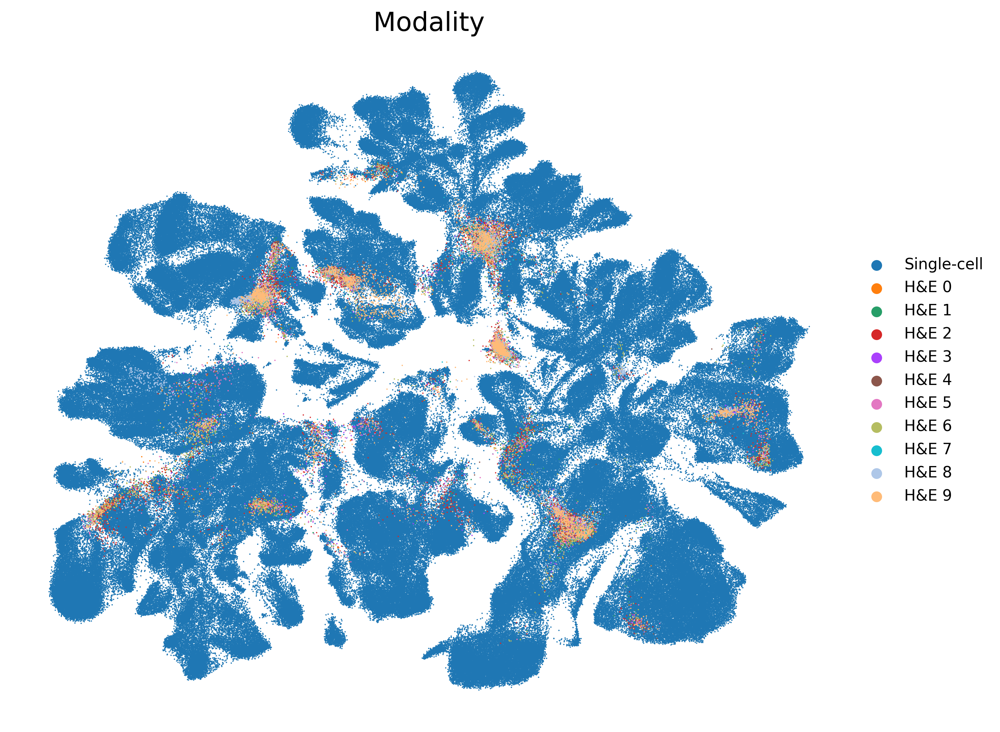

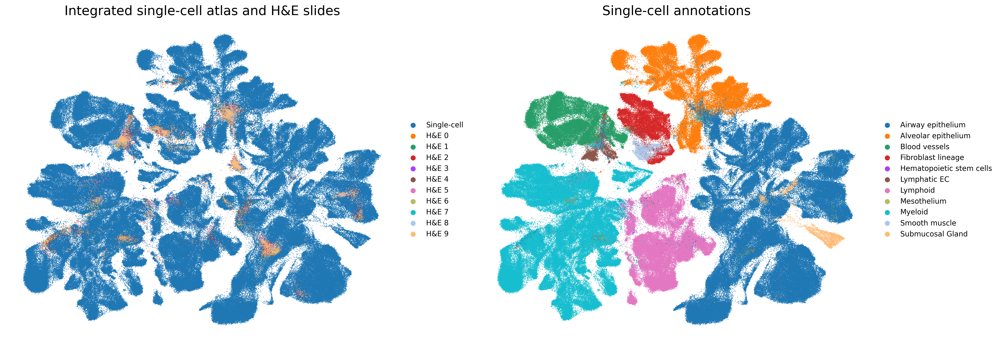

In [82]:
with plt.rc_context({
    "figure.figsize": (10, 8),
    "figure.dpi": 300,
#    "font.size": 17,  # Increase font size
    "axes.titlesize": 17,
    "axes.labelsize": 17,
#    "legend.fontsize": 17,
    "xtick.labelsize": 17,
    "ytick.labelsize": 17
}):

    fig = sc.pl.umap(
        adata_concat, 
        color=["Modality", transfer_label],
        hspace=7,
        size=3,
        show=False,
        frameon=False,
        return_fig=True
    )

    # Custom titles for each subplot
    custom_titles = ["Integrated single-cell atlas and H&E slides", "Single-cell annotations"]
    for ax, title in zip(fig.axes, custom_titles):
        ax.set_title(title, fontsize=18)
        ax.set_xlabel("")  # Hide x-axis label
        ax.set_ylabel("")  # Hide y-axis label

    #fig.savefig("figures/Lung_Xenium_ref_atlas_umap.png", dpi=300, bbox_inches="tight")
    plt.show()


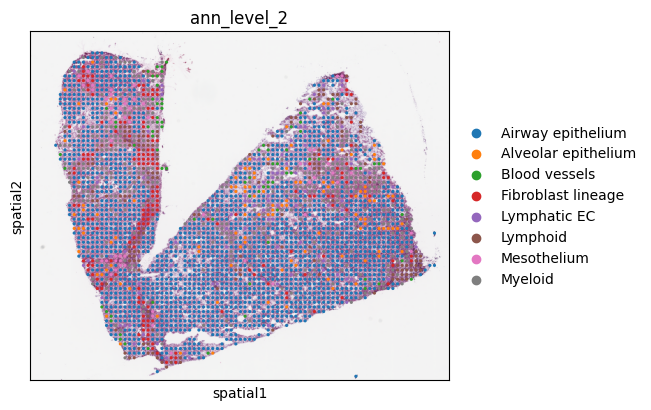

In [86]:
sq.pl.spatial_scatter(adatas[5], color="ann_level_2", size=15)
plt.show()

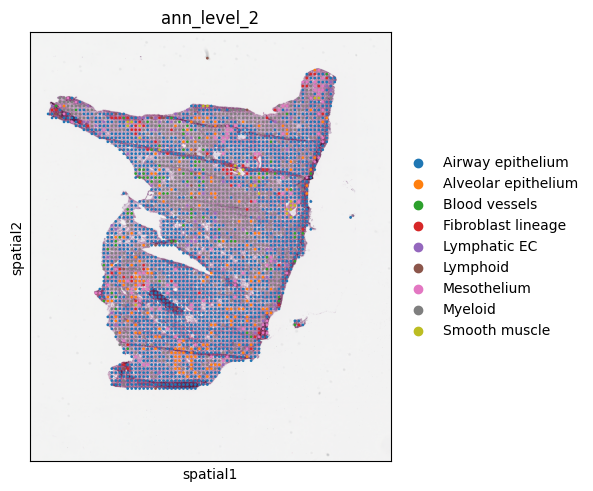

In [87]:
sq.pl.spatial_scatter(adatas[6], color="ann_level_2", size=15)
plt.show()

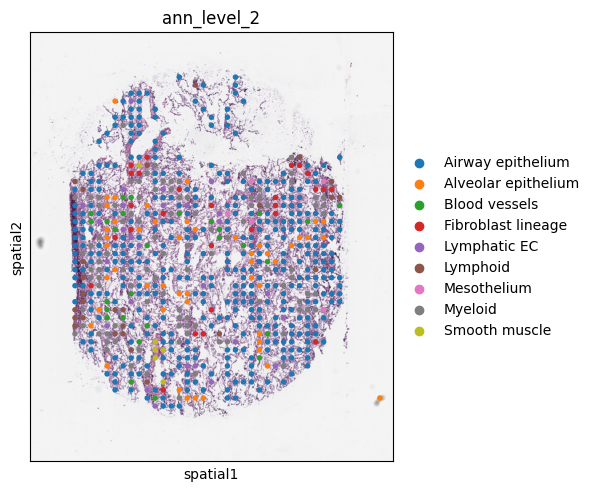

In [88]:
sq.pl.spatial_scatter(adatas[7], color="ann_level_2", size=15)
plt.show()

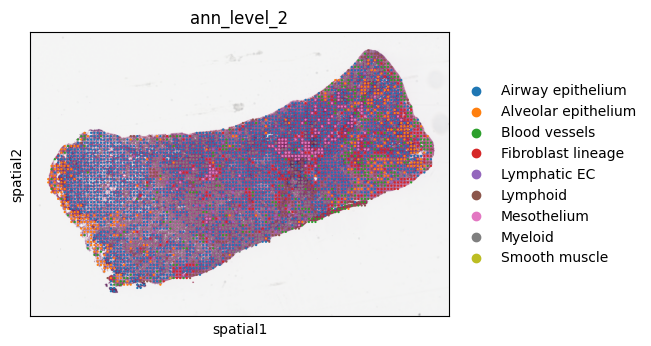

In [90]:
sq.pl.spatial_scatter(adatas[2], color="ann_level_2", size=15)
plt.show()